# Analysis of "Happiness and Corruption 2015-2020" Dataset

## Part 1: Exploratory Data Analysis (EDA)

The aim is: to analyze the dataset and summarize the key insights and characteristics of the data.

**EDA checklist:**
1.	Understanding the dataset, and its shape
2.	Checking the data type of each columns	
3.	Categorical & Numerical columns
4.  Checking for missing values
5.	Descriptive summary of the dataset
6.	Groupby for classification problems


In [1]:
import opendatasets as od
import os
import numpy as np
import pandas as pd
import numpy as np
import plotly.graph_objects as go
import seaborn as sns
import plotly.express as px

In [2]:
!pip install opendatasets

### Importing Libraries

### Loading the dataset from Kaggle

In [34]:
dataset = 'https://www.kaggle.com/datasets/eliasturk/world-happiness-based-on-cpi-20152020'
od.download(dataset)

data_dir = '.\world-happiness-based-on-cpi-20152020'
os.listdir(data_dir)

df_happiness = pd.read_csv('WorldHappiness_Corruption_2015_2020.csv')
df_happiness.head()

Skipping, found downloaded files in ".\world-happiness-based-on-cpi-20152020" (use force=True to force download)


,Country,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,continent,Year,social_support,cpi_score
0,Norway,7.537,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027,Europe,2015,0.0,88
1,Denmark,7.522,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707,Europe,2015,0.0,91
2,Iceland,7.504,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715,Europe,2015,0.0,79
3,Switzerland,7.494,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716,Europe,2015,0.0,86
4,Finland,7.469,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182,Europe,2015,0.0,90


In [6]:
# checking the shape of dataframe
df_happiness.shape

(792, 13)

In [7]:
# checking the data types
df_happiness.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 792 entries, 0 to 791
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Country            792 non-null    object 
 1   happiness_score    792 non-null    float64
 2   gdp_per_capita     792 non-null    float64
 3   family             792 non-null    float64
 4   health             792 non-null    float64
 5   freedom            792 non-null    float64
 6   generosity         792 non-null    float64
 7   government_trust   792 non-null    float64
 8   dystopia_residual  792 non-null    float64
 9   continent          792 non-null    object 
 10  Year               792 non-null    int64  
 11  social_support     792 non-null    float64
 12  cpi_score          792 non-null    int64  
dtypes: float64(9), int64(2), object(2)
memory usage: 80.6+ KB


In [8]:
# checking for missing values
df_happiness.isnull().sum()

Country              0
happiness_score      0
gdp_per_capita       0
family               0
health               0
freedom              0
generosity           0
government_trust     0
dystopia_residual    0
continent            0
Year                 0
social_support       0
cpi_score            0
dtype: int64

In [9]:
# looking for unique values of years to categorize the dataset
df_happiness.Year.unique()

array([2015, 2016, 2017, 2018, 2019, 2020], dtype=int64)

### Statistical summary of the data - Descriptive Statistics
### Statistical summary for each year

In [10]:
df_happiness.describe()

,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,Year,social_support,cpi_score
count,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000,792.000000
mean,5.473310,0.929217,0.504998,0.648691,0.427016,0.212440,0.125720,1.379277,2017.500000,0.609302,44.327020
std,1.124726,0.385774,0.552736,0.232261,0.148003,0.121660,0.109032,1.075276,1.708904,0.640754,19.508833
min,2.566900,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.000000,0.000000,11.000000
25%,4.590750,0.644242,0.000000,0.510070,0.325433,0.125784,0.052862,0.000000,2016.000000,0.000000,30.000000
50%,5.485500,0.994544,0.000000,0.685397,0.439621,0.197000,0.089000,1.731948,2017.500000,0.176214,38.000000
75%,6.300500,1.228677,1.040410,0.815641,0.546280,0.273250,0.154250,2.236894,2019.000000,1.268250,57.000000
max,7.808700,2.096000,1.610574,1.141000,0.724000,0.838075,0.551910,3.602140,2020.000000,1.644000,91.000000


In [11]:
mask_2015 = df_happiness.Year.isin([2015])
df_happiness_2015 = df_happiness[mask_2015]

mask_2016 = df_happiness.Year.isin([2016])
df_happiness_2016 = df_happiness[mask_2016]

mask_2017 = df_happiness.Year.isin([2017])
df_happiness_2017 = df_happiness[mask_2017]

mask_2018 = df_happiness.Year.isin([2018])
df_happiness_2018 = df_happiness[mask_2018]

mask_2019 = df_happiness.Year.isin([2019])
df_happiness_2019 = df_happiness[mask_2019]

mask_2020 = df_happiness.Year.isin([2020])
df_happiness_2020 = df_happiness[mask_2020]

In [12]:
df_happiness_2015

,Country,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,continent,Year,social_support,cpi_score
0,Norway,7.537,1.616463,1.533524,0.796667,0.635423,0.362012,0.315964,2.277027,Europe,2015,0.0,88
1,Denmark,7.522,1.482383,1.551122,0.792566,0.626007,0.355280,0.400770,2.313707,Europe,2015,0.0,91
2,Iceland,7.504,1.480633,1.610574,0.833552,0.627163,0.475540,0.153527,2.322715,Europe,2015,0.0,79
3,Switzerland,7.494,1.564980,1.516912,0.858131,0.620071,0.290549,0.367007,2.276716,Europe,2015,0.0,86
4,Finland,7.469,1.443572,1.540247,0.809158,0.617951,0.245483,0.382612,2.430182,Europe,2015,0.0,90
...,...,...,...,...,...,...,...,...,...,...,...,...,...
127,Guinea,3.507,0.244550,0.791245,0.194129,0.348588,0.264815,0.110938,1.552312,South America,2015,0.0,25
128,Togo,3.495,0.305445,0.431883,0.247106,0.380426,0.196896,0.095665,1.837229,Africa,2015,0.0,32
129,Rwanda,3.471,0.368746,0.945707,0.326425,0.581844,0.252756,0.455220,0.540061,Africa,2015,0.0,54
130,Tanzania,3.349,0.511136,1.041990,0.364509,0.390018,0.354256,0.066035,0.621130,Africa,2015,0.0,30


In [13]:
df_happiness_2015.describe()

,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,Year,social_support,cpi_score
count,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.0,132.0,132.000000
mean,5.437485,1.006057,1.214255,0.573726,0.415984,0.246797,0.122533,1.858101,2015.0,0.0,44.522727
std,1.123665,0.401016,0.269337,0.216503,0.143638,0.138671,0.102669,0.490348,0.0,0.0,20.374534
min,2.905000,0.091623,0.431883,0.005565,0.030370,0.000000,0.000000,0.377914,2015.0,0.0,11.000000
25%,4.551000,0.728374,1.061783,0.435740,0.311599,0.152825,0.054846,1.608737,2015.0,0.0,29.750000
50%,5.330000,1.080270,1.268937,0.618185,0.438880,0.229811,0.087969,1.829808,2015.0,0.0,38.000000
75%,6.347250,1.314731,1.431314,0.727889,0.523084,0.325990,0.153181,2.156203,2015.0,0.0,56.500000
max,7.537000,1.741944,1.610574,0.949492,0.658249,0.838075,0.464308,2.898639,2015.0,0.0,91.000000


In [14]:
df_happiness_2016.describe()

,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,Year,social_support,cpi_score
count,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.0,132.0,132.000000
mean,5.440242,0.863956,1.006589,0.654272,0.433527,0.234824,0.138885,2.108206,2016.0,0.0,44.265152
std,1.160156,0.389739,0.273266,0.225841,0.148665,0.128840,0.119008,0.535643,0.0,0.0,19.677111
min,2.839000,0.015300,0.139950,0.000000,0.000000,0.000000,0.000000,0.670420,2016.0,0.0,14.000000
25%,4.569500,0.594172,0.862275,0.532968,0.331247,0.142225,0.058960,1.791085,2016.0,0.0,30.000000
50%,5.346000,0.929910,1.039410,0.708780,0.435515,0.215860,0.104525,2.095415,2016.0,0.0,38.000000
75%,6.308750,1.152320,1.233710,0.813548,0.551270,0.307547,0.174760,2.452253,2016.0,0.0,57.000000
max,7.587000,1.563910,1.402230,1.025250,0.669730,0.795880,0.551910,3.602140,2016.0,0.0,90.000000


In [15]:
df_happiness_2017.describe()

,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,Year,social_support,cpi_score
count,132.000000,132.000000,132.0,132.000000,132.000000,132.000000,132.000000,132.0,132.0,132.000000,132.000000
mean,5.506848,0.933182,0.0,0.755167,0.400818,0.182735,0.110318,0.0,2017.0,1.238879,44.310606
std,1.100135,0.375648,0.0,0.214457,0.140117,0.097544,0.098516,0.0,0.0,0.276210,19.434813
min,3.203000,0.046000,0.0,0.192000,0.000000,0.000000,0.000000,0.0,2017.0,0.437000,15.000000
25%,4.617750,0.683000,0.0,0.607500,0.310500,0.108750,0.044250,0.0,2017.0,1.103250,30.000000
50%,5.524000,1.003000,0.0,0.806500,0.430500,0.175000,0.082000,0.0,2017.0,1.311000,38.000000
75%,6.205000,1.225000,0.0,0.885750,0.508750,0.248250,0.134000,0.0,2017.0,1.463500,57.000000
max,7.769000,1.609000,0.0,1.141000,0.631000,0.566000,0.453000,0.0,2017.0,1.624000,89.000000


In [16]:
df_happiness_2018.describe()

,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,Year,social_support,cpi_score
count,132.000000,132.000000,132.0,132.000000,132.000000,132.000000,132.000000,132.0,132.0,132.000000,132.000000
mean,5.464697,0.913265,0.0,0.620212,0.462644,0.180932,0.113886,0.0,2018.0,1.239621,44.159091
std,1.113583,0.376672,0.0,0.229041,0.154199,0.101325,0.101720,0.0,0.0,0.284824,19.440192
min,2.905000,0.076000,0.0,0.000000,0.025000,0.000000,0.000000,0.0,2018.0,0.372000,14.000000
25%,4.553250,0.655750,0.0,0.478000,0.362000,0.107500,0.049750,0.0,2018.0,1.085500,29.750000
50%,5.483000,0.980500,0.0,0.669500,0.487000,0.171500,0.082000,0.0,2018.0,1.301000,38.000000
75%,6.272500,1.190250,0.0,0.782000,0.580750,0.243500,0.135250,0.0,2018.0,1.471750,58.000000
max,7.632000,2.096000,0.0,1.008000,0.724000,0.598000,0.457000,0.0,2018.0,1.644000,88.000000


In [17]:
df_happiness_2019.describe()

,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,Year,social_support,cpi_score
count,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.000000,132.0,132.0,132.000000
mean,5.430705,0.967428,0.809141,0.571824,0.375272,0.240034,0.134544,2.332467,2019.0,0.0,44.272727
std,1.155424,0.400594,0.270233,0.218969,0.139402,0.135668,0.111307,0.520515,0.0,0.0,19.295647
min,2.905000,0.068310,0.000000,0.000000,0.043200,0.000000,0.000000,0.916810,2019.0,0.0,15.000000
25%,4.448000,0.690867,0.643212,0.436280,0.266232,0.148900,0.054748,2.041655,2019.0,0.0,29.000000
50%,5.395000,1.043515,0.865455,0.618540,0.394920,0.218690,0.098790,2.293125,2019.0,0.0,39.000000
75%,6.356500,1.270918,1.038473,0.729965,0.483148,0.310223,0.176175,2.666335,2019.0,0.0,56.000000
max,7.526000,1.697520,1.183260,0.947190,0.608480,0.819710,0.505210,3.559060,2019.0,0.0,87.000000


In [18]:
df_happiness_2020.describe()

,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,Year,social_support,cpi_score
count,132.000000,132.000000,132.0,132.000000,132.000000,132.000000,132.000000,132.000000,132.0,132.000000,132.000000
mean,5.559882,0.891414,0.0,0.716946,0.473853,0.189315,0.134151,1.976888,2020.0,1.177313,44.431818
std,1.109684,0.359175,0.0,0.229935,0.140163,0.102301,0.117986,0.554536,0.0,0.273086,19.176637
min,2.566900,0.000000,0.0,0.108744,0.000000,0.000000,0.000000,0.257241,2020.0,0.352428,15.000000
25%,4.781475,0.619225,0.0,0.564430,0.385308,0.114755,0.056379,1.672847,2020.0,1.028799,30.000000
50%,5.581600,0.948268,0.0,0.771441,0.498619,0.172538,0.099167,2.049735,2020.0,1.231823,39.000000
75%,6.309900,1.175032,0.0,0.859509,0.588309,0.256808,0.172715,2.350730,2020.0,1.395509,56.250000
max,7.808700,1.536676,0.0,1.137814,0.693270,0.569814,0.533162,3.440810,2020.0,1.547567,88.000000


In [19]:
# Grouping the data based on the year
df_happiness_year = df_happiness.groupby(["Year"]).mean()
df_happiness_year

,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,social_support,cpi_score
Year,,,,,,,,,,
2015,5.437485,1.006057,1.214255,0.573726,0.415984,0.246797,0.122533,1.858101,0.000000,44.522727
2016,5.440242,0.863956,1.006589,0.654272,0.433527,0.234824,0.138885,2.108206,0.000000,44.265152
2017,5.506848,0.933182,0.000000,0.755167,0.400818,0.182735,0.110318,0.000000,1.238879,44.310606
2018,5.464697,0.913265,0.000000,0.620212,0.462644,0.180932,0.113886,0.000000,1.239621,44.159091
2019,5.430705,0.967428,0.809141,0.571824,0.375272,0.240034,0.134544,2.332467,0.000000,44.272727
2020,5.559882,0.891414,0.000000,0.716946,0.473853,0.189315,0.134151,1.976888,1.177313,44.431818


## Part 2: Data Visualization

The aim is: to visualize the dataset, make it more understandable and see the patterns in it.

In [21]:
fig = go.Figure(
    data=[
        go.Bar( x=df_happiness_year.index, y=df_happiness_year.happiness_score),
],
    layout={
        'yaxis': {'title': 'Mean Happiness Score'},
        'xaxis': {'title': 'Years'}
    }
)

fig.show()

In [22]:
# this is how we can get all the column names of the dataframe
for column in df_happiness_year:
  print(column)

happiness_score
gdp_per_capita
family
health
freedom
generosity
government_trust
dystopia_residual
social_support
cpi_score


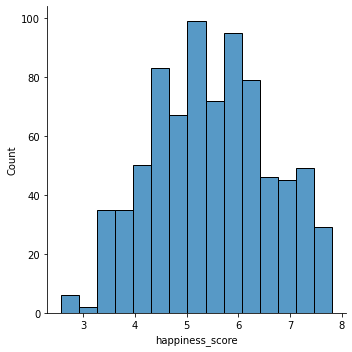

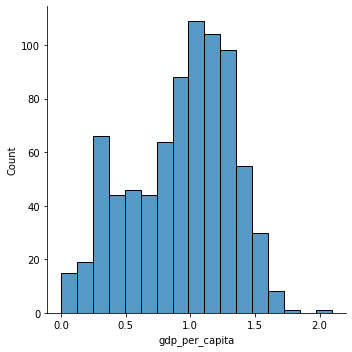

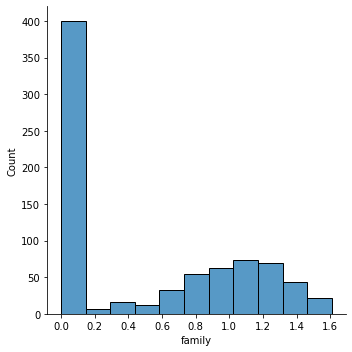

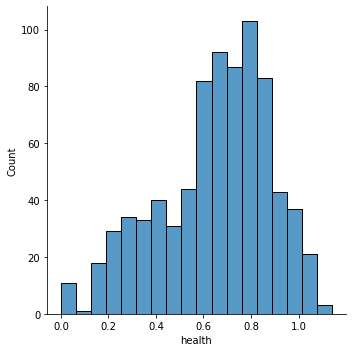

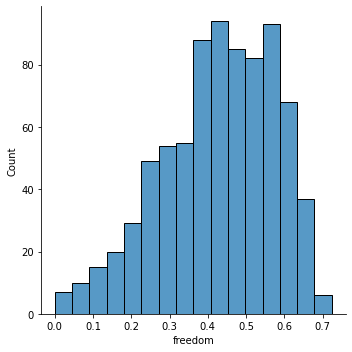

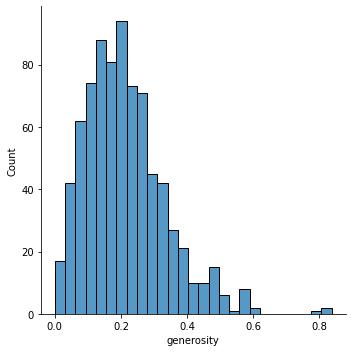

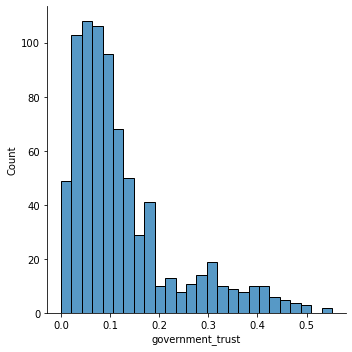

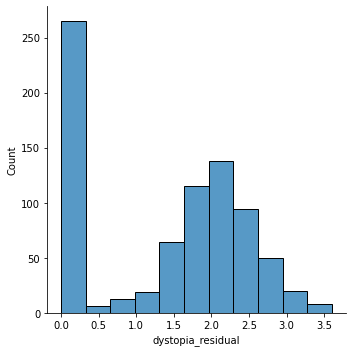

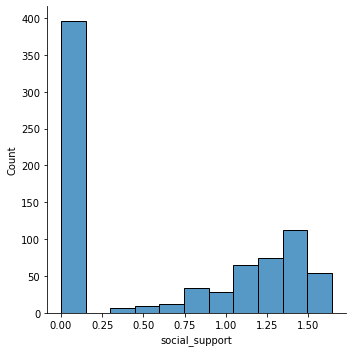

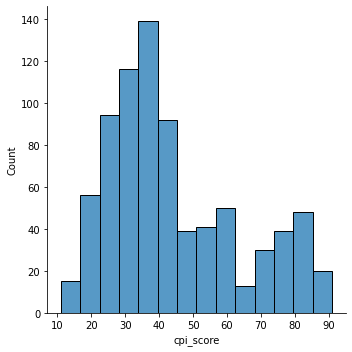

In [23]:
# creating a for loop to get the distribution plot for all columns
for column in df_happiness_year:
  sns.displot(x=column, data=df_happiness)

<AxesSubplot:xlabel='happiness_score', ylabel='Count'>

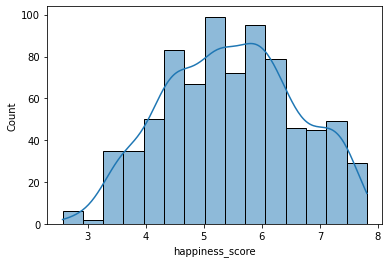

In [24]:
sns.histplot(x=df_happiness.happiness_score, kde=True)

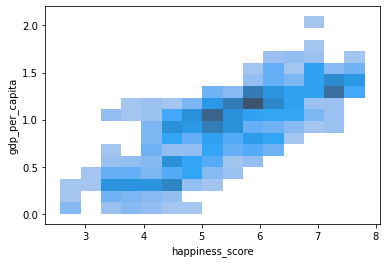

In [25]:
graph_per_capita = sns.histplot(data=df_happiness, x="happiness_score", y="gdp_per_capita")

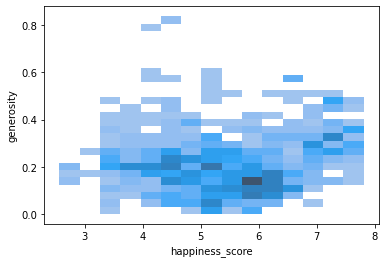

In [26]:
graph_per_generosity = sns.histplot(data=df_happiness, x="happiness_score", y="generosity")

### Pair plot
Comparing every column in the dataframe with each other and plotting it.

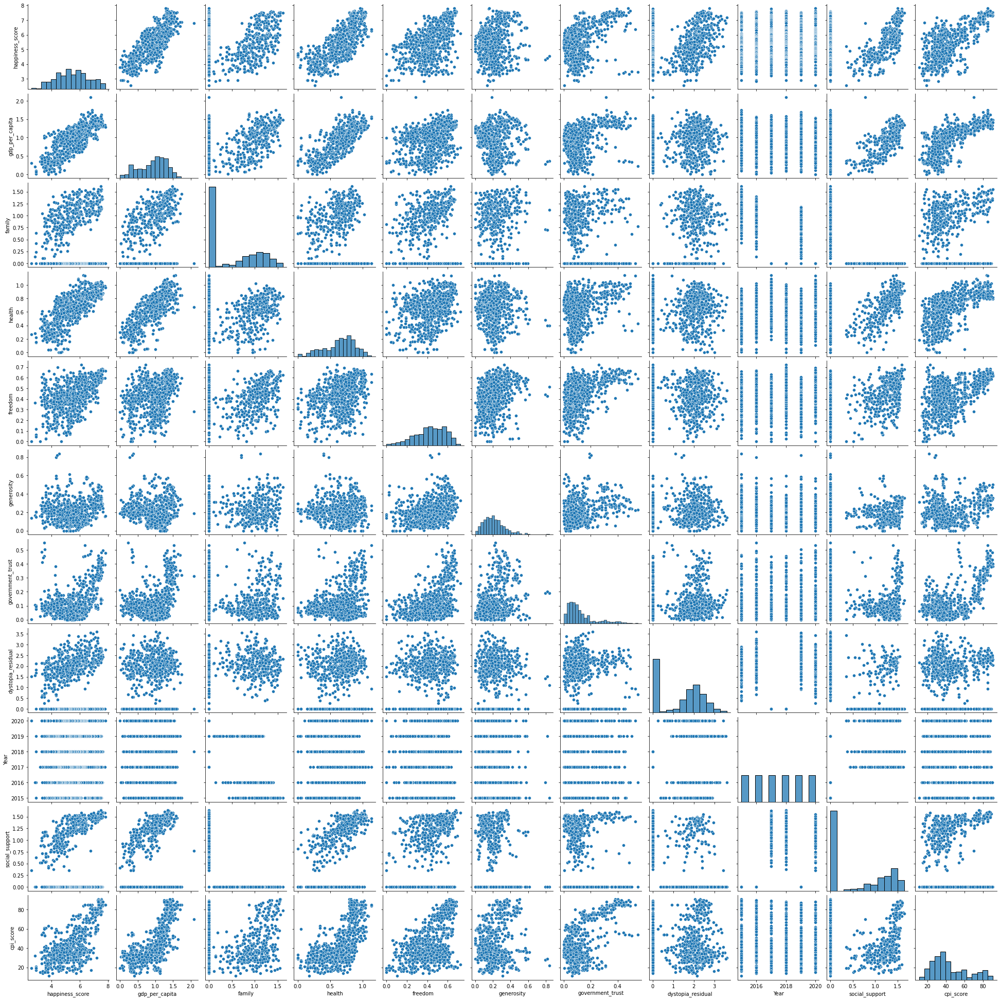

In [27]:
sns.pairplot(df_happiness)

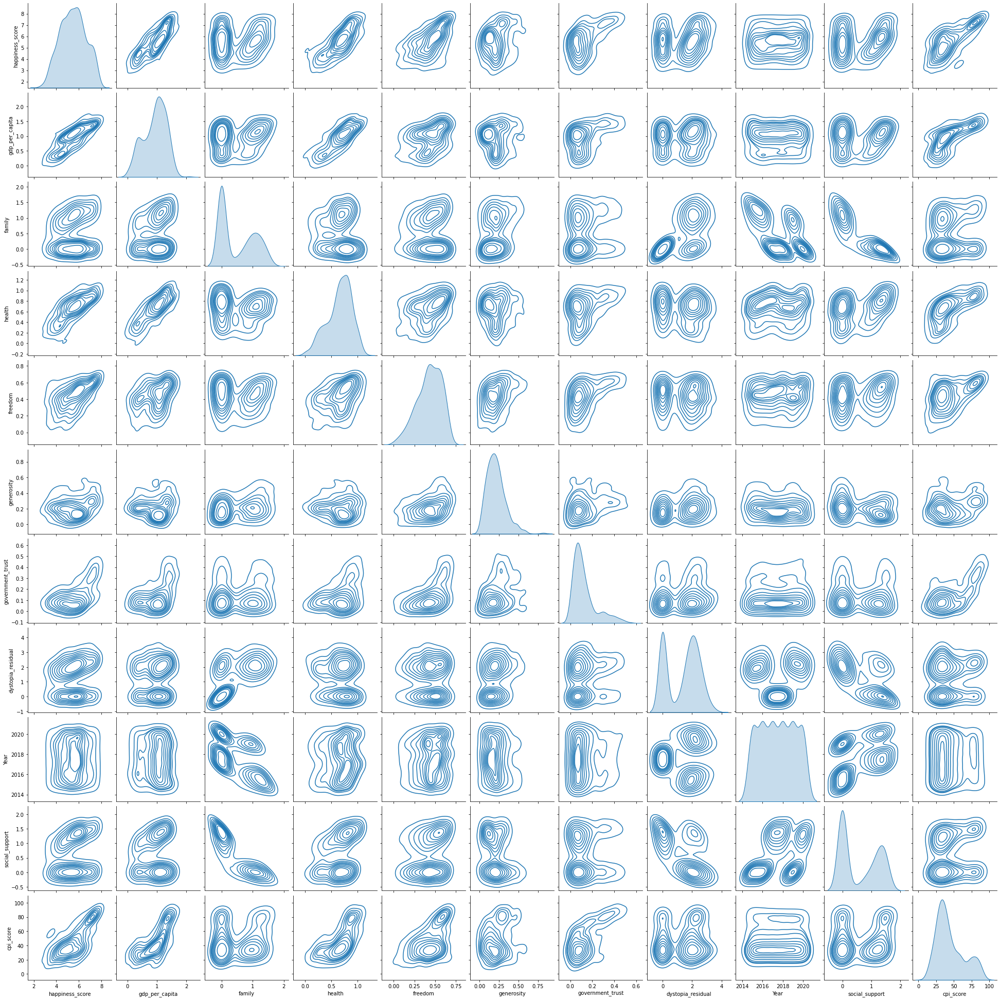

In [28]:
sns.pairplot(df_happiness, kind="kde")

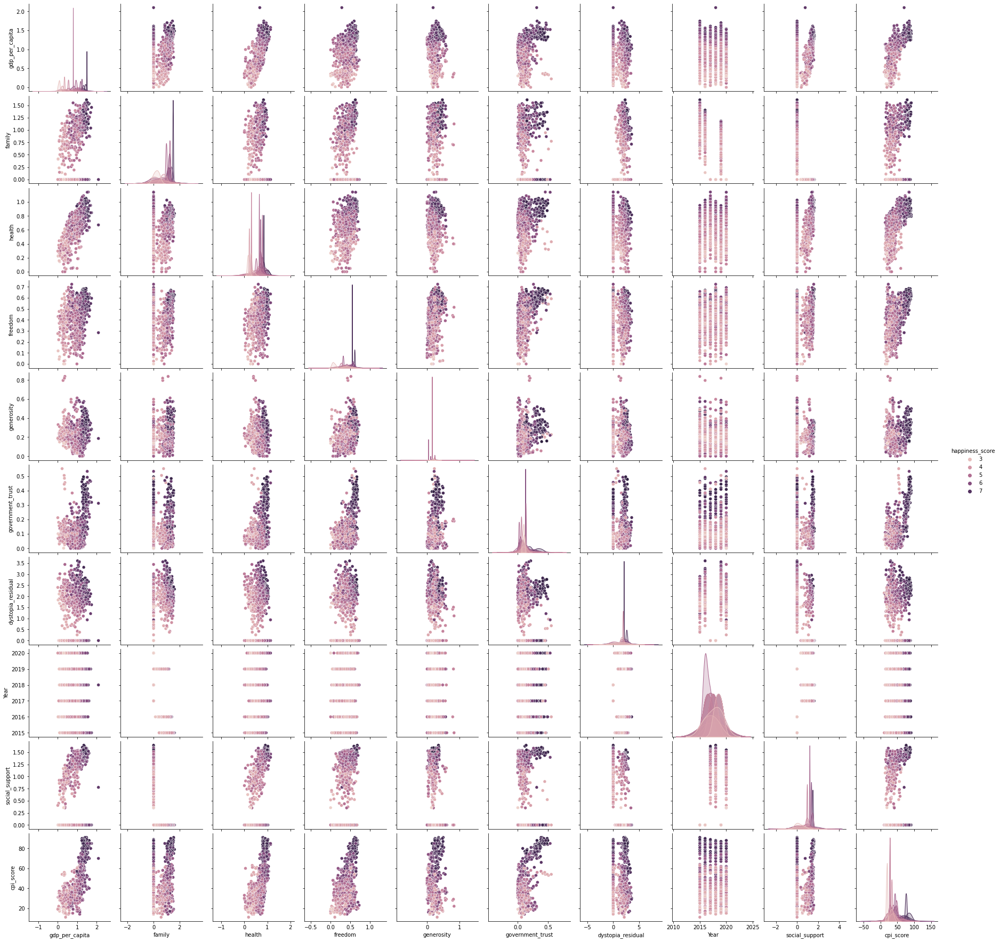

In [29]:
sns.pairplot(df_happiness, hue="happiness_score")

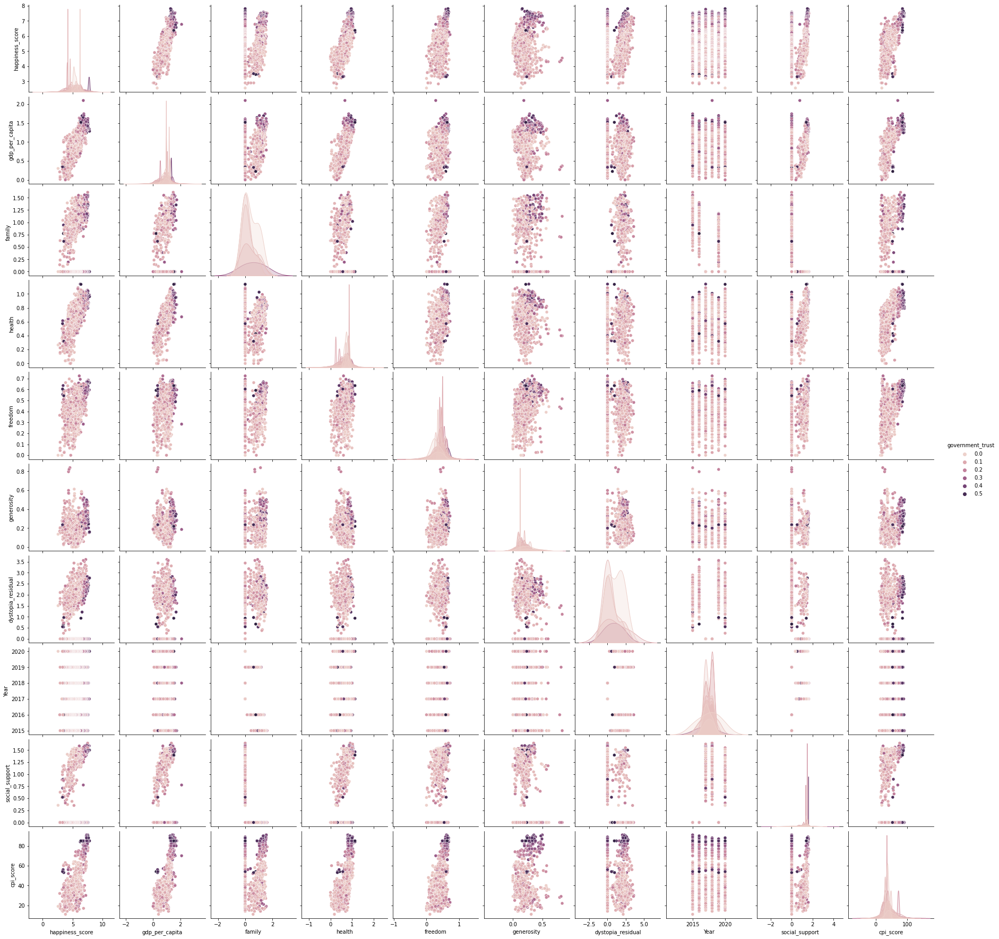

In [30]:
sns.pairplot(df_happiness, hue="government_trust")

In [31]:
# Box plot for visualizing the outliers in the dataset
for column in df_happiness_year:
    fig = px.box(df_happiness, y=column)
    fig.show()

In [32]:
correlation_matrix = df_happiness.corr()
correlation_matrix

,happiness_score,gdp_per_capita,family,health,freedom,generosity,government_trust,dystopia_residual,Year,social_support,cpi_score
happiness_score,1.000000,0.793267,0.154946,0.753534,0.544284,0.155419,0.455477,0.174161,0.023495,0.192633,0.693001
gdp_per_capita,0.793267,1.000000,0.218191,0.774980,0.340260,-0.018355,0.359068,0.042710,-0.035782,0.111701,0.704483
family,0.154946,0.218191,1.000000,-0.054683,0.013833,0.245437,0.114767,0.600243,-0.588630,-0.869885,0.132031
health,0.753534,0.774980,-0.054683,1.000000,0.381869,-0.028882,0.312741,-0.073157,0.070172,0.347438,0.644478
freedom,0.544284,0.340260,0.013833,0.381869,1.000000,0.306240,0.473980,-0.015270,0.058195,0.208709,0.482923
generosity,0.155419,-0.018355,0.245437,-0.028882,0.306240,1.000000,0.280039,0.147750,-0.109797,-0.215131,0.165972
government_trust,0.455477,0.359068,0.114767,0.312741,0.473980,0.280039,1.000000,0.098366,0.021781,-0.008136,0.620089
dystopia_residual,0.174161,0.042710,0.600243,-0.073157,-0.015270,0.147750,0.098366,1.000000,0.057519,-0.654570,0.032630
Year,0.023495,-0.035782,-0.588630,0.070172,0.058195,-0.109797,0.021781,0.057519,1.000000,0.448616,-0.001460
social_support,0.192633,0.111701,-0.869885,0.347438,0.208709,-0.215131,-0.008136,-0.654570,0.448616,1.000000,0.109077


<AxesSubplot:>

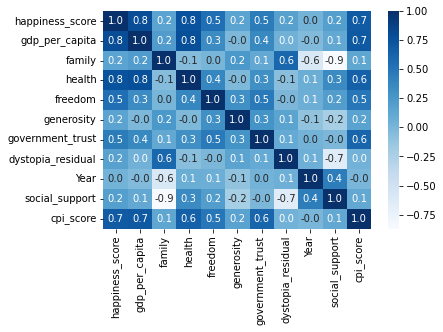

In [33]:
# constructing a heat map to visualize the correlation matrix
sns.heatmap(correlation_matrix, cbar=True, fmt='.1f', annot=True, cmap='Blues')